# 문제정의
시간대/지역별에 따라 일어나는 사고 빈도 분석

# 예상 결과:
1. 지역별/시간대 별로 사고가 많이 일어나는 클러스터 빌견
2. 사고 규모가 큰 사건이 잘 발생하는 지역/시간대를 발견

# 데이터 선택:
출처: https://www.data.go.kr/data/15070340/fileData.do#tab-layer-file

해당 데이터에는 개별 사고에 대한 데이터가 정리되어 있다.
데이터의 개요는 아래와 같다.

항목: 발생시각/발생위치/피해자수/사고유형 등
범위: 2015년~2022년
총 항목 수: 27978

분석하고자 하는 사건 발생 시간/지역에 대한 데이터를 포함하고 있어, 분석에 유용하다고 판단 하였다.
목 수도 2만개를 넘어 유효한 결과를 얻을 수 있다고 판단하였다.

또한 도로교통공단에서 제공된 데이터로 신뢰도도 높고, 다양한 항목이 존재하며,
Nan와 같은 무효 데이터가 적다.







1. 파일을 로드하고 연도마다 달라지는 항목 이름들을 확인한다.

In [143]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

#데이터 출처
#https://www.data.go.kr/data/15070340/fileData.do#tab-layer-file

al = []  # 열 이름을 추적할 빈 리스트 초기화
df_list = []  # DataFrame들을 저장할 빈 리스트 초기화

# 2015년부터 2022년까지의 데이터를 불러오기
for i in range(2015, 2023):
    temp = pd.read_csv(f'사망교통사고정보({i}).csv', encoding='EUC-KR')
    df_list.append(temp)
    al.append(set(temp.columns))
df = pd.concat(df_list, ignore_index=True)


#열 이름의 종류를 확인하기 위한 코드
#연도마다 열의 이름이 조금씩 바뀌기 때문에 이를 추적하기 위해서 작성함
#cr(cummon columns): 모든 연도에서 공통되는 열을 찾음
#ul(unique columns): 모든 연도에서 나타나는 열을 저장
cr = set(al[0])
ul = set(al[0])
for i in al:
    cr = i & cr
    ul = i | ul

print('모든 열: ',ul)
print('공통되는 열: ',cr)
print('공통되지 않는 열:', ul-cr)

모든 열:  {'발생년월일시분', '부상자수', '경도', '사고유형_중분류', '발생위치X_UTMK', '발생분', '법규위반', '발생위치Y_UTMK', '사고유형', '발생위치Y(UTMK)', '부상신고자수', '법규위반_대분류', '위도', '중상자수', '가해자_당사자종별_대분류', '가해자법규위반', '당사자종별_1당', '요일', '발생지시군구', '당사자종별_2당', '발생년월일시', '사망자수', '주야', '도로형태_대분류', '당사자종별_1당_대분류', '도로형태', '발생지시도', '사고유형_대분류', '발생년', '발생위치X(UTMK)', '당사자종별_2당_대분류', '가해자_당사자종별', '경상자수', '피해자_당사자종별_대분류', '사상자수', '피해자_당사자종별'}
공통되는 열:  {'사고유형', '부상신고자수', '발생년', '위도', '사망자수', '주야', '도로형태_대분류', '중상자수', '경상자수', '경도', '도로형태', '발생지시도', '요일', '사고유형_대분류', '사고유형_중분류', '발생지시군구'}
공통되지 않는 열: {'발생년월일시분', '부상자수', '발생위치X_UTMK', '발생분', '법규위반', '발생위치Y_UTMK', '발생위치Y(UTMK)', '법규위반_대분류', '가해자_당사자종별_대분류', '가해자법규위반', '당사자종별_1당', '당사자종별_2당', '발생년월일시', '당사자종별_1당_대분류', '발생위치X(UTMK)', '당사자종별_2당_대분류', '가해자_당사자종별', '피해자_당사자종별_대분류', '사상자수', '피해자_당사자종별'}


In [144]:
#연도마다 법규 위반의 분류법이 바뀌어서 그것을 확인하기 위한 코드
#위에서 확인한 법규 위반 관련 항목은 3가지가 있다. 아래와 같다.
a1 = set(df['법규위반'])
a2 = set(df['법규위반_대분류'])
a3 = set(df['가해자법규위반'])

print('법규위반: ', a1)
print('법규위반_대분류: ', a2)
print('가해자법규위반: ', a3)

법규위반:  {'과속', '기타(운전자법규위반)', '보행자 보호의무 위반', '중앙선 침범', '안전운전 의무 불이행', '정비불량 제차의 운전금지위반', '차로위반(진로변경 위반)', '안전거리 미확보', nan, '부당한 회전', '교차로 통행방법 위반', '앞지르기 금지위반', '서행 및 일시정지위반', '신호위반', '과로', '긴급자동차에대한 피양의무 위반', '철길건널목 통과방법위반', '직진 및 우회전차의 통행방해', '앞지르기 방법위반'}
법규위반_대분류:  {'운전자법규위반', '정비불량', nan}
가해자법규위반:  {'교차로 통행방법 위반', '과속', '보행자 보호의무 위반', '신호위반', '기타', '중앙선 침범', '안전거리 미확보', '안전운전 의무 불이행', nan}


In [145]:
#피해자/가해자 항목에 해당하는 데이터를 살펴보는 코드

# 피해자
a1 = set(df['당사자종별_2당_대분류'])
a2 = set(df['당사자종별_2당'])
a3 = set(df['피해자_당사자종별_대분류'])
a4 = set(df['피해자_당사자종별'])

# 가해자
b1 = set(df['당사자종별_1당_대분류'])
b2 = set(df['당사자종별_1당'])
b3 = set(df['가해자_당사자종별_대분류'])
b4 = set(df['가해자_당사자종별'])

# 결과 출력
print()
print("피해자 대분류 (2당):", a1)
print("피해자 종류 (2당):", a2)
print()
print("피해자 대분류:", a3)
print("피해자 종류:", a4)

print()
print()
print("가해자 대분류 (1당):", b1)
print("가해자 종류 (1당):", b2)
print()
print("가해자 대분류:", b3)
print("가해자 종류:", b4)
print()



피해자 대분류 (2당): {'특수차', '화물차', '불명', '원동기장치자전거', '이륜차', '승합차', '기타', '없음', '보행자', nan, '농기계', '건설기계', '자전거', '사륜오토바이(ATV)', '승용차'}
피해자 종류 (2당): {'특수차', '기타', '소형', '보행자', '경형', '원동기장치자전거', '대형', nan, '농기계', '건설기계', '승용차', '사발이', '불명', '승합차', '없음', '화물차', '이륜차', '중형', '사륜오토바이(ATV)', '자전거'}

피해자 대분류: {'특수차', '화물차', '불명', '원동기장치자전거', '이륜차', '승합차', '기타', '없음', '보행자', '농기계', nan, '건설기계', '자전거', '사륜오토바이(ATV)', '승용차', '열차'}
피해자 종류: {'특수차', '기타', '소형', '보행자', '경형', '원동기장치자전거', '대형', '농기계', nan, '건설기계', '승용차', '사발이', '불명', '승합차', '없음', '개인형이동장치(PM)', '개인형이동수단(PM)', '화물차', '이륜차', '중형', '사륜오토바이(ATV)', '자전거', '열차'}


가해자 대분류 (1당): {'특수차', '화물차', '불명', '원동기장치자전거', '이륜차', '승합차', '기타', nan, '농기계', '사륜오토바이(ATV)', '건설기계', '자전거', '개인형이동수단(PM)', '승용차'}
가해자 종류 (1당): {'특수차', '기타', '소형', '경형', '원동기장치자전거', '대형', nan, '농기계', '건설기계', '승용차', '사발이', '불명', '승합차', '개인형이동수단(PM)', '화물차', '이륜차', '중형', '사륜오토바이(ATV)', '자전거'}

가해자 대분류: {'특수차', '화물차', '불명', '원동기장치자전거', '이륜차', '승합차', '기타', '농기계', nan, '사륜오토바이(ATV)', '건설기계'

In [146]:
#설명을 생략한 열 이름들

'발생위치Y_UTMK'
'발생위치X_UTMK'
'발생위치Y(UTMK)',
'발생위치X(UTMK)', 
'부상자수', '사상자수'
'발생분'
'발생년월일시', '발생분','발생년월일시분'

('발생년월일시', '발생분', '발생년월일시분')

# 연도별 데이터를 통합

1. 의미는 같지만 이름이 미묘하게 다른 항목을 통합한다.
2. '발생분' 항목은 의미를 알 수 없어서 버린다.
3. 연도별로 사상자/부상자 표현이 바뀌어서 통일한다. 이때 사상자와 부상자의 개념이 다른 것을 유념하고 통일한다.
4. 발생 년도는 중복된 데이터 이므로 버린다.
5. 주/야 데이터는 중복되긴 하지만 분석에 유의미한 영향을 미칠 수 있으므로 남긴다.

In [147]:
#본격적으로 연도별 데이터를 통합하는 코드

df = []  # DataFrame들을 저장할 빈 리스트 초기화

for i in range(2015, 2023):
    #각 연도에 해당하는 csv 파일 읽음
    temp = pd.read_csv(f'사망교통사고정보({i}).csv', encoding='EUC-KR')

    # 같은 의미를 가진 열이름을 통합
    temp = temp.rename(columns={'발생위치X(UTMK)': '발생위치X_UTMK', '발생위치Y(UTMK)': '발생위치Y_UTMK', '발생년월일시': '시각', '발생년': '년', '발생년월일시분': '시각'})

    #같은 의미를 가진 값을 통일
    temp['주야'] = temp['주야'].apply(lambda x: '주' if x =='주간' else x)
    temp['주야'] = temp['주야'].apply(lambda x: '야' if x =='야간' else x)
    
    # 불필요한 열이 존재하면 제거
    temp = temp.drop(columns=['년'])
    if '발생분' in temp.columns:
        temp = temp.drop(columns=['발생분'])
    if '법규위반_대분류' in temp.columns:
        temp = temp.drop(columns=['법규위반_대분류'])
    
    #사상자수, 부상자 통합
    if '사상자수' in temp.columns and '부상자수' not in temp.columns:
        temp['부상자수'] = temp['사상자수'] - temp['사망자수']

    if '부상자수' in temp.columns and '사상자수' not in temp.columns:
        temp['사상자수'] = temp['부상자수'] + temp['사망자수']

    #법규 위반관련 열을 정리
    if '법규위반' in temp.columns:
        temp = temp.rename(columns={'법규위반': '가해자법규위반'})
        # 가해자법규위반의 값에 따라 법규 위반 유형 분류
        valid_violations = ['과속', '중앙선 침범', '안전운전 의무 불이행', '안전거리 미확보', '보행자 보호의무 위반', '교차로 통행방법 위반', '신호위반']
        temp['가해자법규위반'] = temp['가해자법규위반'].apply(lambda x: x if x in valid_violations else '기타')

    #가해자/피해자의 차량 종류를 분류하는 열을 통합
    if '가해자_당사자종별_대분류' in temp.columns:
        temp = temp.drop(columns=['가해자_당사자종별'])
        temp = temp.rename(columns={'가해자_당사자종별_대분류': '가해자_당사자종별'})
    if '피해자_당사자종별_대분류' in temp.columns:
        temp = temp.drop(columns=['피해자_당사자종별'])
        temp = temp.rename(columns={'피해자_당사자종별_대분류': '피해자_당사자종별'})
    if '당사자종별_1당' in temp.columns and '당사자종별_1당_대분류' in temp.columns:
        temp = temp.drop(columns=['당사자종별_1당'])
        temp = temp.rename(columns={'당사자종별_1당_대분류': '가해자_당사자종별'})
    if '당사자종별_2당' in temp.columns and '당사자종별_2당_대분류' in temp.columns:
        temp = temp.drop(columns=['당사자종별_2당'])
        temp = temp.rename(columns={'당사자종별_2당_대분류': '피해자_당사자종별'})
    

    df.append(temp)

df = pd.concat(df)
df = df.drop(columns=['경도','위도'])

# 통합된 데이터들을 살펴보기 위한 코드들

In [148]:
df.head()

,시각,주야,요일,사망자수,사상자수,중상자수,경상자수,부상신고자수,발생지시도,발생지시군구,...,사고유형_중분류,사고유형,가해자법규위반,도로형태_대분류,도로형태,가해자_당사자종별,피해자_당사자종별,발생위치X_UTMK,발생위치Y_UTMK,부상자수
0,2015-01-01 05:57,야,목,1,1,0,0,0,서울,영등포구,...,기타,기타,안전운전 의무 불이행,단일로,지하차도(도로)내,승용차,건설기계,949521.0,1946280.0,0
1,2015-01-01 05:30,야,목,1,1,0,0,0,울산,남구,...,횡단중,횡단중,안전운전 의무 불이행,교차로,교차로부근,승용차,보행자,1159202.0,1728395.0,0
2,2015-01-01 14:30,주,목,1,1,0,0,0,전북,군산시,...,전도전복,전도전복,안전운전 의무 불이행,기타/불명,기타/불명,농기계,없음,934705.0,1776858.0,0
3,2015-01-01 21:00,야,목,1,1,0,0,0,광주,동구,...,횡단중,횡단중,안전운전 의무 불이행,단일로,횡단보도상,승용차,보행자,948213.0,1684783.0,0
4,2015-01-02 06:50,주,금,1,1,0,0,0,부산,영도구,...,횡단중,횡단중,안전운전 의무 불이행,단일로,기타단일로,승용차,보행자,1142714.0,1678614.0,0


In [149]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27978 entries, 0 to 2657
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   시각          27978 non-null  object 
 1   주야          27978 non-null  object 
 2   요일          27978 non-null  object 
 3   사망자수        27978 non-null  int64  
 4   사상자수        27978 non-null  int64  
 5   중상자수        27978 non-null  int64  
 6   경상자수        27978 non-null  int64  
 7   부상신고자수      27978 non-null  int64  
 8   발생지시도       27978 non-null  object 
 9   발생지시군구      27978 non-null  object 
 10  사고유형_대분류    27978 non-null  object 
 11  사고유형_중분류    27978 non-null  object 
 12  사고유형        27978 non-null  object 
 13  가해자법규위반     27978 non-null  object 
 14  도로형태_대분류    27978 non-null  object 
 15  도로형태        27978 non-null  object 
 16  가해자_당사자종별   27978 non-null  object 
 17  피해자_당사자종별   27153 non-null  object 
 18  발생위치X_UTMK  27978 non-null  float64
 19  발생위치Y_UTMK  27978 non-null  flo

In [150]:
df.describe()

,사망자수,사상자수,중상자수,경상자수,부상신고자수,발생위치X_UTMK,발생위치Y_UTMK,부상자수
count,27978.000000,27978.000000,27978.000000,27978.000000,27978.000000,2.797800e+04,2.797800e+04,27978.000000
mean,1.035099,1.563872,0.232468,0.267496,0.028808,1.006043e+06,1.818563e+06,0.528773
std,0.234124,1.904879,0.845925,1.209512,0.321445,7.776706e+04,1.184097e+05,1.848648
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,9.458280e+05,1.720782e+06,0.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000,9.754675e+05,1.824435e+06,0.000000
75%,1.000000,2.000000,0.000000,0.000000,0.000000,1.075838e+06,1.931349e+06,0.000000
max,10.000000,105.000000,54.000000,68.000000,27.000000,1.298136e+06,2.056736e+06,104.000000


In [151]:
#데이터 형태 확인
li=[]
for i in df.columns:
    li.append(set(df[i]))

for i, k in zip(df.columns,li):
    print(i, k)

시각 {'2016-05-07 02:00', '2016-02-05 10:00', '2020-01-30 01', '2019-04-25 11', '2017-02-13 16:00', '2018-03-19 19:45', '2018-09-21 05:57', '2017-09-05 04:00', '2017-06-03 15:00', '2022-02-22 05:00', '2019-03-25 15', '2018-02-23 07:45', '2022-07-24 19:00', '2019-07-14 01', '2017-02-23 02:00', '2018-02-24 20:21', '2015-01-13 11:05', '2015-05-17 20:00', '2015-10-14 13:20', '2015-05-26 09:10', '2020-11-14 15', '2017-08-16 23:00', '2021-11-03 13:00', '2019-10-10 23', '2017-05-27 16:00', '2022-05-07 04:00', '2017-11-21 06:00', '2015-08-17 17:08', '2020-01-21 21', '2015-10-06 14:50', '2018-03-11 12:15', '2017-12-27 01:00', '2016-04-11 20:00', '2016-10-13 21:00', '2018-07-19 12:00', '2018-11-01 15:40', '2018-06-13 01:43', '2018-03-21 04:01', '2021-02-07 12:00', '2022-08-14 04:00', '2017-08-03 03:00', '2020-07-12 03', '2019-10-19 18', '2016-07-11 08:00', '2019-06-28 20', '2017-04-24 08:00', '2019-12-06 00', '2022-02-06 18:00', '2016-12-06 07:00', '2017-03-12 22:00', '2020-06-22 16', '2018-08-22 

# 데이터 정재/결측치 처리

1. 피해자가 맨몸인 경우 항목 값을 없음/Nan 으로 두가지 방식으로 표현하고 있다. 통일해 준다.
2. 사고 유형이 기타, 불명인 경우 분석에 도움이 되지 않으므로 제거한다.

In [152]:
#noise값, Nan값 필터링
df['피해자_당사자종별'] = df['피해자_당사자종별'].fillna('없음')


#DataFrame에 적용하기 위한 조건 설정
def filter_noise(df):
    valid = ['기타', '기타/불명', '불명']
    conditions = (
        df['사고유형_중분류'].isin(valid) |
        df['사고유형'].isin(valid) |
        df['가해자법규위반'].isin(valid) |
        df['도로형태'].isin(valid) |
        df['가해자_당사자종별'].isin(valid) |
        df['피해자_당사자종별'].isin(valid) |
        (df['발생위치X_UTMK'] < 1) |
        (df['발생위치Y_UTMK'] < 1) )
    return df[~conditions]  # 조건을 만족하지 않는 데이터만 반환
df = filter_noise(df)

In [153]:
df.head()

,시각,주야,요일,사망자수,사상자수,중상자수,경상자수,부상신고자수,발생지시도,발생지시군구,...,사고유형_중분류,사고유형,가해자법규위반,도로형태_대분류,도로형태,가해자_당사자종별,피해자_당사자종별,발생위치X_UTMK,발생위치Y_UTMK,부상자수
1,2015-01-01 05:30,야,목,1,1,0,0,0,울산,남구,...,횡단중,횡단중,안전운전 의무 불이행,교차로,교차로부근,승용차,보행자,1159202.0,1728395.0,0
3,2015-01-01 21:00,야,목,1,1,0,0,0,광주,동구,...,횡단중,횡단중,안전운전 의무 불이행,단일로,횡단보도상,승용차,보행자,948213.0,1684783.0,0
4,2015-01-02 06:50,주,금,1,1,0,0,0,부산,영도구,...,횡단중,횡단중,안전운전 의무 불이행,단일로,기타단일로,승용차,보행자,1142714.0,1678614.0,0
5,2015-01-02 06:34,주,금,1,1,0,0,0,울산,남구,...,차도통행중,차도통행중,안전운전 의무 불이행,교차로,교차로내,승용차,보행자,1168168.0,1720763.0,0
8,2015-01-02 17:40,주,금,1,7,0,6,0,경기,평택시,...,추돌,주정차중 추돌,안전운전 의무 불이행,단일로,기타단일로,화물차,화물차,948003.0,1882268.0,6


In [154]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20450 entries, 1 to 2656
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   시각          20450 non-null  object 
 1   주야          20450 non-null  object 
 2   요일          20450 non-null  object 
 3   사망자수        20450 non-null  int64  
 4   사상자수        20450 non-null  int64  
 5   중상자수        20450 non-null  int64  
 6   경상자수        20450 non-null  int64  
 7   부상신고자수      20450 non-null  int64  
 8   발생지시도       20450 non-null  object 
 9   발생지시군구      20450 non-null  object 
 10  사고유형_대분류    20450 non-null  object 
 11  사고유형_중분류    20450 non-null  object 
 12  사고유형        20450 non-null  object 
 13  가해자법규위반     20450 non-null  object 
 14  도로형태_대분류    20450 non-null  object 
 15  도로형태        20450 non-null  object 
 16  가해자_당사자종별   20450 non-null  object 
 17  피해자_당사자종별   20450 non-null  object 
 18  발생위치X_UTMK  20450 non-null  float64
 19  발생위치Y_UTMK  20450 non-null  flo

In [155]:
#시간 데이터 포맷이 미묘하게 다른 경우를 적절하게 변경


# 모든 시각을 'YYYY-MM-DD HH:MM' 형식으로 통일
df['시각'] = df['시각'].apply(lambda x: x + ':00' if ':' not in x else x)

# '시각' 컬럼을 datetime 객체로 변환
df['시각'] = pd.to_datetime(df['시각'])
df['주야'] = df['주야'].astype('category')
df['요일'] = df['요일'].astype('category')

# 월, 일, 시간 추출
df['월'] = df['시각'].dt.month
df['일'] = df['시각'].dt.day
df['시'] = df['시각'].dt.hour
df['월'] = df['월'].astype('category')

# 2시간 단위로 범주화
time_bins = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24]  # 2시간 간격으로 범위 설정
time_labels = ['00-02', '02-04', '04-06', '06-08', '08-10', '10-12', 
               '12-14', '14-16', '16-18', '18-20', '20-22', '22-24']  # 레이블 설정

# pd.cut을 사용하여 시간 범주화
df['시간_범주'] = pd.cut(df['시'], bins=time_bins, labels=time_labels, right=False)


In [156]:
#카테고리형 데이터를 카테고리 타입으로 변경
df['발생지시도'] = df['발생지시도'].astype('category')
df['발생지시군구'] = df['발생지시군구'].astype('category')
df['사고유형_대분류'] = df['사고유형_대분류'].astype('category')
df['사고유형_중분류'] = df['사고유형_중분류'].astype('category')
df['사고유형'] = df['사고유형'].astype('category')
df['가해자법규위반'] = df['가해자법규위반'].astype('category')
df['도로형태_대분류'] = df['도로형태_대분류'].astype('category')
df['도로형태'] = df['도로형태'].astype('category')
df['가해자_당사자종별'] = df['가해자_당사자종별'].astype('category')
df['피해자_당사자종별'] = df['피해자_당사자종별'].astype('category')

In [157]:
# 사상자수에 따른 라벨 범위 설정
bins = [0, 2, 3, 4, 5, 11,float('inf')]  # 범위의 경계값 설정
labels = ['0-1명', '2명', '3명', '4명', '5-10명', '11명 이상']  # 해당 범위에 대한 라벨
df['사상자수_라벨'] = pd.cut(df['사상자수'], bins=bins, labels=labels, right=False)


In [158]:
#데이터 형태 최종 확인
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20450 entries, 1 to 2656
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   시각          20450 non-null  datetime64[ns]
 1   주야          20450 non-null  category      
 2   요일          20450 non-null  category      
 3   사망자수        20450 non-null  int64         
 4   사상자수        20450 non-null  int64         
 5   중상자수        20450 non-null  int64         
 6   경상자수        20450 non-null  int64         
 7   부상신고자수      20450 non-null  int64         
 8   발생지시도       20450 non-null  category      
 9   발생지시군구      20450 non-null  category      
 10  사고유형_대분류    20450 non-null  category      
 11  사고유형_중분류    20450 non-null  category      
 12  사고유형        20450 non-null  category      
 13  가해자법규위반     20450 non-null  category      
 14  도로형태_대분류    20450 non-null  category      
 15  도로형태        20450 non-null  category      
 16  가해자_당사자종별   20450 non-null  

In [159]:
#데이터 형태 최종 확인
li=[]
for i in df.columns:
    li.append(set(df[i]))

for i, k in zip(df.columns,li):
    print(i, k)

시각 {Timestamp('2017-05-31 03:00:00'), Timestamp('2017-09-26 12:00:00'), Timestamp('2016-04-04 10:00:00'), Timestamp('2020-06-10 22:00:00'), Timestamp('2021-06-30 18:00:00'), Timestamp('2016-09-26 17:00:00'), Timestamp('2016-02-27 01:00:00'), Timestamp('2018-05-02 11:35:00'), Timestamp('2020-07-22 12:00:00'), Timestamp('2020-05-27 10:00:00'), Timestamp('2022-04-16 23:00:00'), Timestamp('2016-02-02 15:00:00'), Timestamp('2018-07-20 08:20:00'), Timestamp('2015-09-01 16:50:00'), Timestamp('2015-08-04 06:40:00'), Timestamp('2020-06-24 00:00:00'), Timestamp('2016-05-20 02:00:00'), Timestamp('2018-05-23 10:30:00'), Timestamp('2015-07-23 06:40:00'), Timestamp('2020-07-17 21:00:00'), Timestamp('2017-07-22 23:00:00'), Timestamp('2016-12-30 05:00:00'), Timestamp('2015-06-23 07:10:00'), Timestamp('2021-05-23 05:00:00'), Timestamp('2016-06-16 21:00:00'), Timestamp('2020-03-25 06:00:00'), Timestamp('2016-03-18 17:00:00'), Timestamp('2018-05-30 17:02:00'), Timestamp('2021-07-28 17:00:00'), Timestamp(

분석에 사용할 항목을 선택한다. 시군구/사고 유형은 이번 분석에서 제외한다.

In [160]:
all_columns = ['요일','월','시','시간_범주','사상자수_라벨', '사상자수','사망자수','부상자수','중상자수','경상자수','부상신고자수','발생위치X_UTMK', '발생위치Y_UTMK']

label_colums = ['요일','시간_범주','사상자수_라벨']
numeric_columns = [col for col in all_columns if col not in label_colums]
person_columns = ['사상자수','사망자수', '부상자수', '중상자수', '경상자수', '부상신고자수']
person_columns = [col for col in person_columns if col in all_columns]
time_columns = ['월','시']

anly =df[all_columns]
anly.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20450 entries, 1 to 2656
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   요일          20450 non-null  category
 1   월           20450 non-null  category
 2   시           20450 non-null  int32   
 3   시간_범주       20450 non-null  category
 4   사상자수_라벨     20450 non-null  category
 5   사상자수        20450 non-null  int64   
 6   사망자수        20450 non-null  int64   
 7   부상자수        20450 non-null  int64   
 8   중상자수        20450 non-null  int64   
 9   경상자수        20450 non-null  int64   
 10  부상신고자수      20450 non-null  int64   
 11  발생위치X_UTMK  20450 non-null  float64 
 12  발생위치Y_UTMK  20450 non-null  float64 
dtypes: category(4), float64(2), int32(1), int64(6)
memory usage: 1.6 MB


# 정규화 전 데이터 분석

우선 정규화 전에 데이터 분포를 확인해 보자.
월/시간대 별로 사건이 발생한 빈도를 지도 형태로 조사해 보았다.

특정 지역에 사건이 집중되어 있고, 시간대 별로 미묘하게 사건의 분포가 달라지는 것을 확인할 수 있다.

C:\Users\april\AppData\Local\Temp\ipykernel_30956\1135634587.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(group_by)


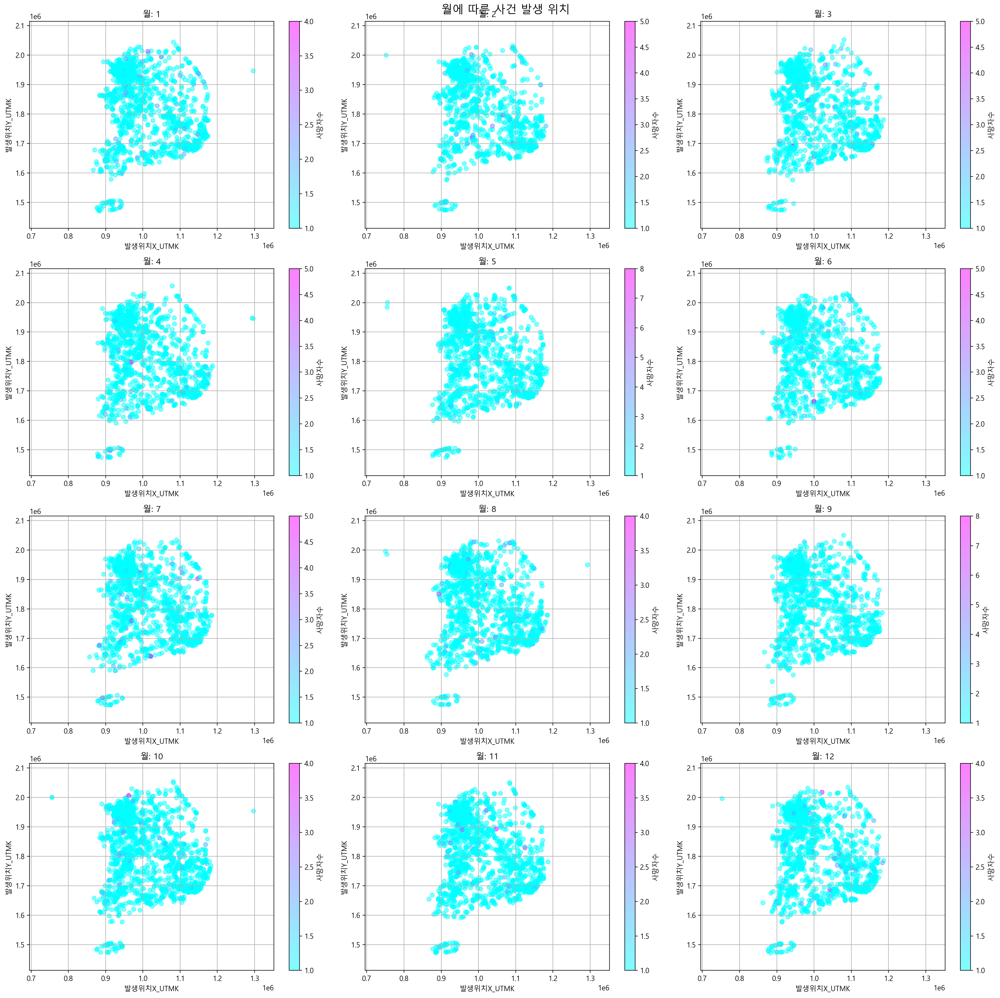

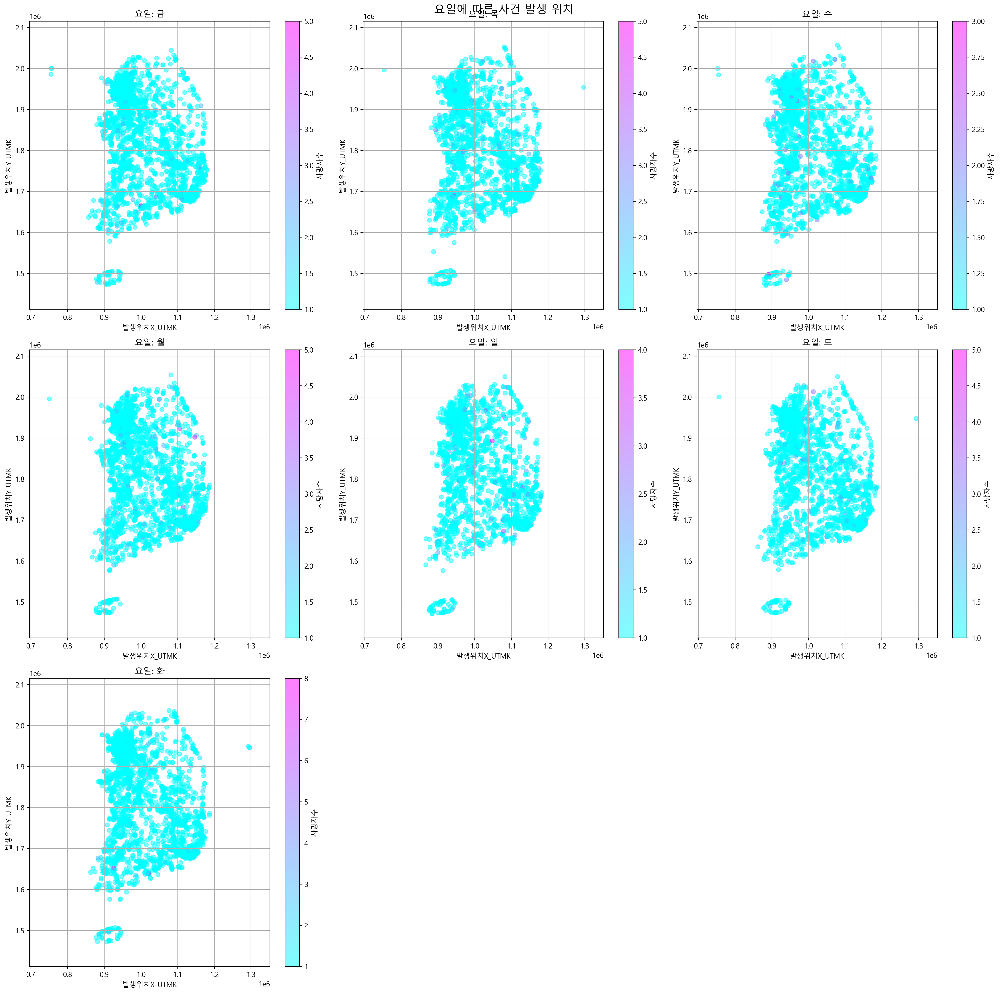

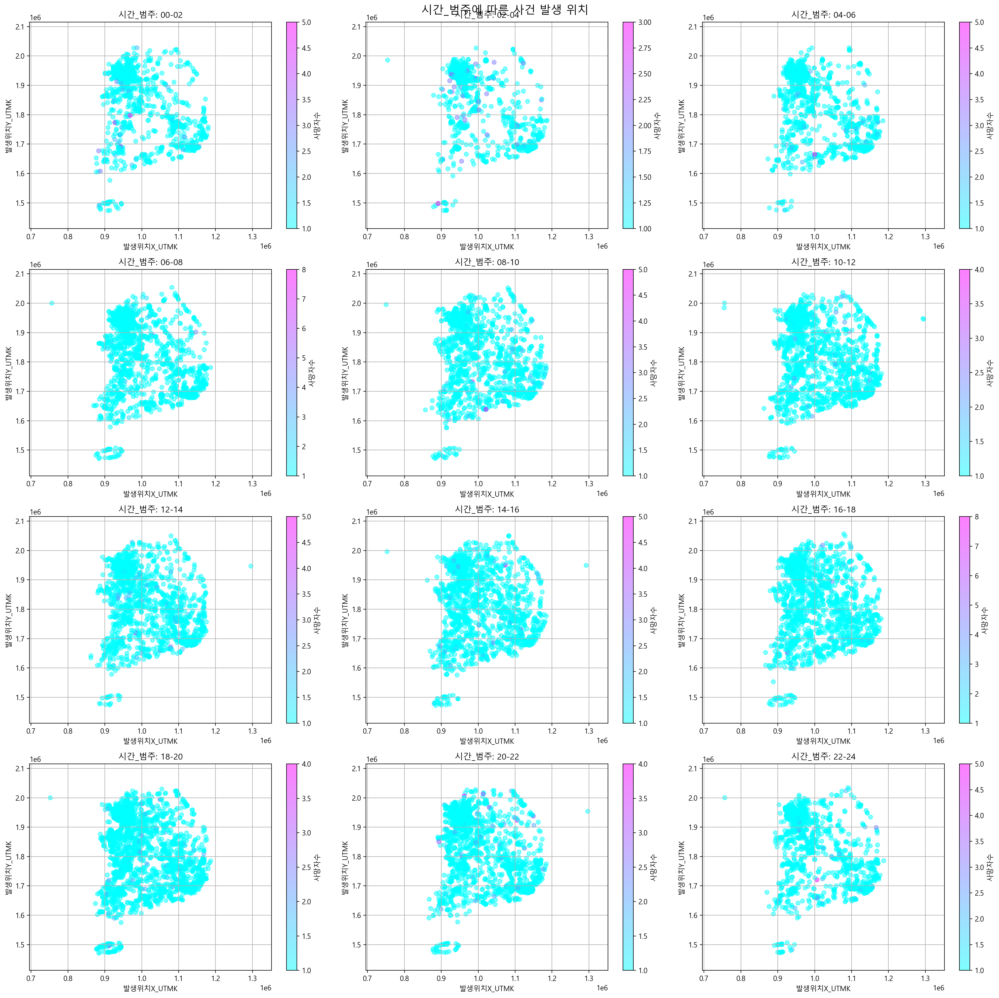

In [161]:
import math
#한글 설정
plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False

def paint_map(data, group_by):
    # 그룹별 데이터 분할
    grouped_data = data.groupby(group_by)
    num_groups = len(grouped_data)  # 그룹의 개수 확인

    # subplot의 행과 열 계산
    num_rows = math.ceil(num_groups / 3)  # 그룹 수에 따라 subplot의 행 계산
    num_cols = min(num_groups, 3)  # subplot의 최대 열 수는 3

    # x 범위와 y 범위 설정을 위한 초기값 설정
    x_min = data['발생위치X_UTMK'].min()
    x_max = data['발생위치X_UTMK'].max()
    y_min = data['발생위치Y_UTMK'].min()
    y_max = data['발생위치Y_UTMK'].max()

    # 비율 설정
    n = 1.2  # 원래 범위의 1.2배 크기로 확대

    # 새로운 x와 y의 범위 설정
    x_range = (x_max - x_min) * n
    y_range = (y_max - y_min) * n
    x_center = (x_max + x_min) / 2
    y_center = (y_max + y_min) / 2

    # 그래프 크기와 해상도 설정
    plt.figure(figsize=(20, 20), dpi=200)

    # 그룹별로 subplot에 그래프 배치
    for index, (group_value, group) in enumerate(grouped_data, 1):
        plt.subplot(num_rows, num_cols, index)  # subplot의 행과 열 설정
        plt.scatter(group['발생위치X_UTMK'], group['발생위치Y_UTMK'], c=group['사망자수'], cmap='cool', alpha=0.5)
        plt.title(f'{group_by}: {group_value}')
        plt.xlabel('발생위치X_UTMK')
        plt.ylabel('발생위치Y_UTMK')
        plt.xlim(x_center - x_range / 2, x_center + x_range / 2)  # x 범위 설정
        plt.ylim(y_center - y_range / 2, y_center + y_range / 2)  # y 범위 설정
        plt.colorbar(label='사망자수')  # colorbar 추가
        plt.grid(True)

    plt.suptitle(f'{group_by}에 따른 사건 발생 위치', fontsize=16)  # 서브 플롯의 통합 제목 추가
    plt.tight_layout()  # subplot 간 간격 조정
    plt.show()

paint_map(anly, '월')
paint_map(anly, '요일')
paint_map(anly, '시간_범주')


여기에서 보여주는 plot들은 사건이 발생한 위치를 보여준다.

각 사건마다 시간대별/월별/요일별 로 서브플롯을 사용하여 보여주고 있다.

전체적으로 고르게 분포한 모습을 볼 수 있다.

C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(group_by)
C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=group['발생위치X_UTMK'], y=group['발생위치Y_UTMK'], cmap="viridis", shade=True, bw_adjust=0.5, ax=ax)
C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=group['발생위치X_UTMK'], y=group['발생위치Y_UTMK'], cmap="viridis", shade=True, bw_adjust=0

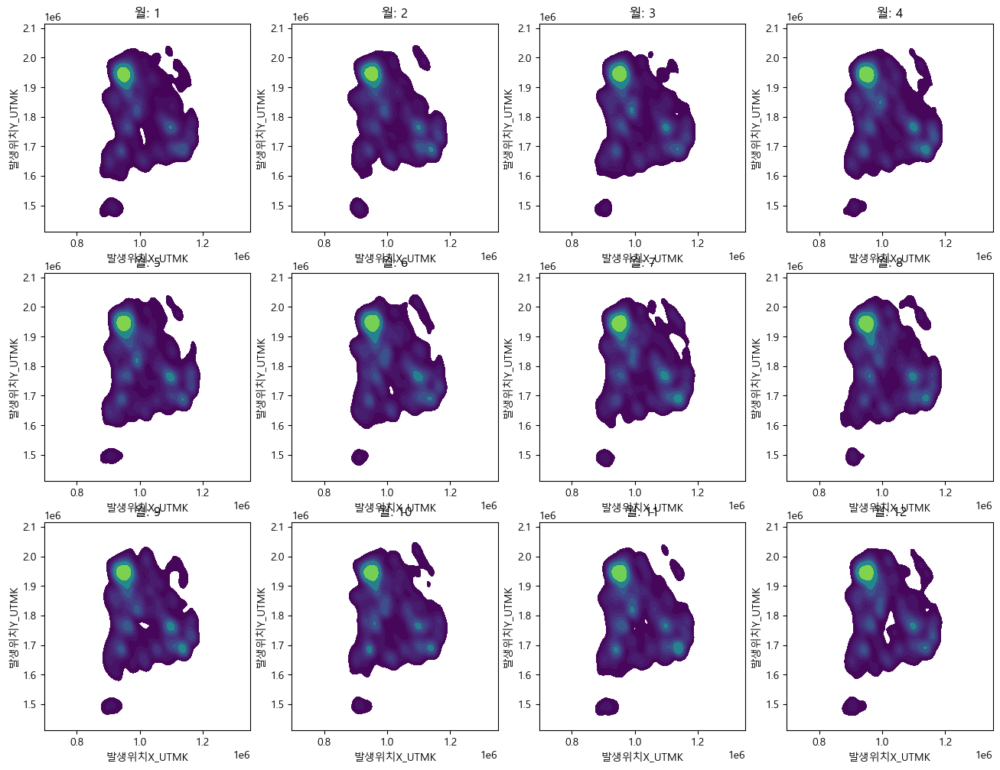

<Figure size 4000x4000 with 0 Axes>

C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(group_by)
C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=group['발생위치X_UTMK'], y=group['발생위치Y_UTMK'], cmap="viridis", shade=True, bw_adjust=0.5, ax=ax)
C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=group['발생위치X_UTMK'], y=group['발생위치Y_UTMK'], cmap="viridis", shade=True, bw_adjust=0

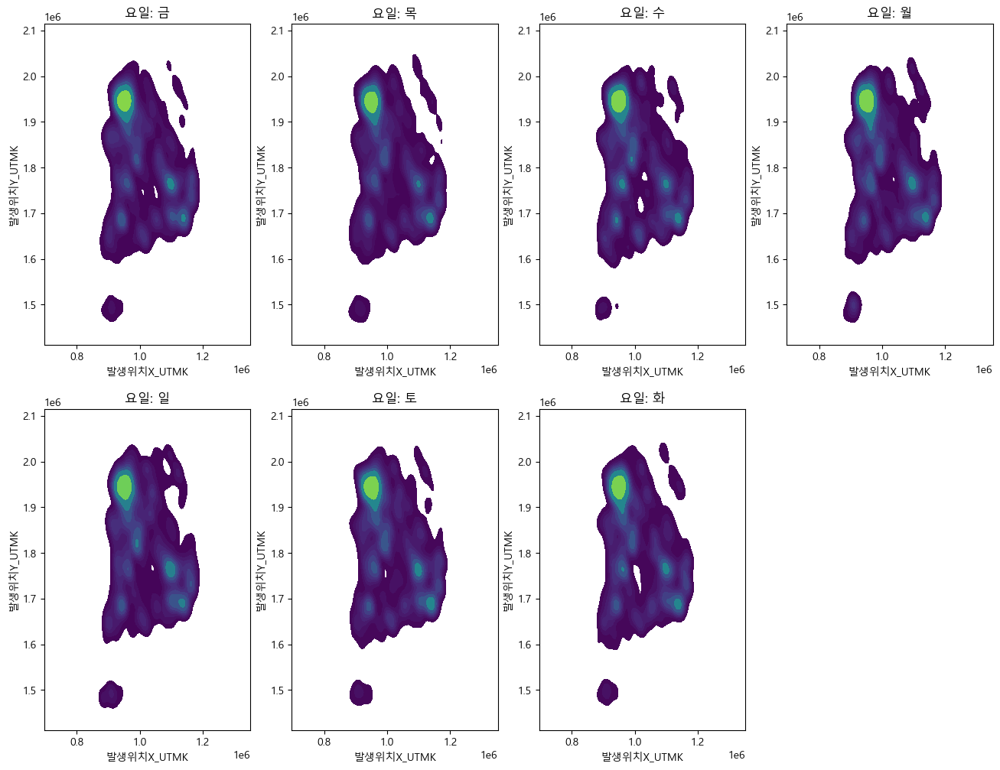

<Figure size 4000x4000 with 0 Axes>

C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(group_by)
C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=group['발생위치X_UTMK'], y=group['발생위치Y_UTMK'], cmap="viridis", shade=True, bw_adjust=0.5, ax=ax)
C:\Users\april\AppData\Local\Temp\ipykernel_30956\1569046183.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=group['발생위치X_UTMK'], y=group['발생위치Y_UTMK'], cmap="viridis", shade=True, bw_adjust=0

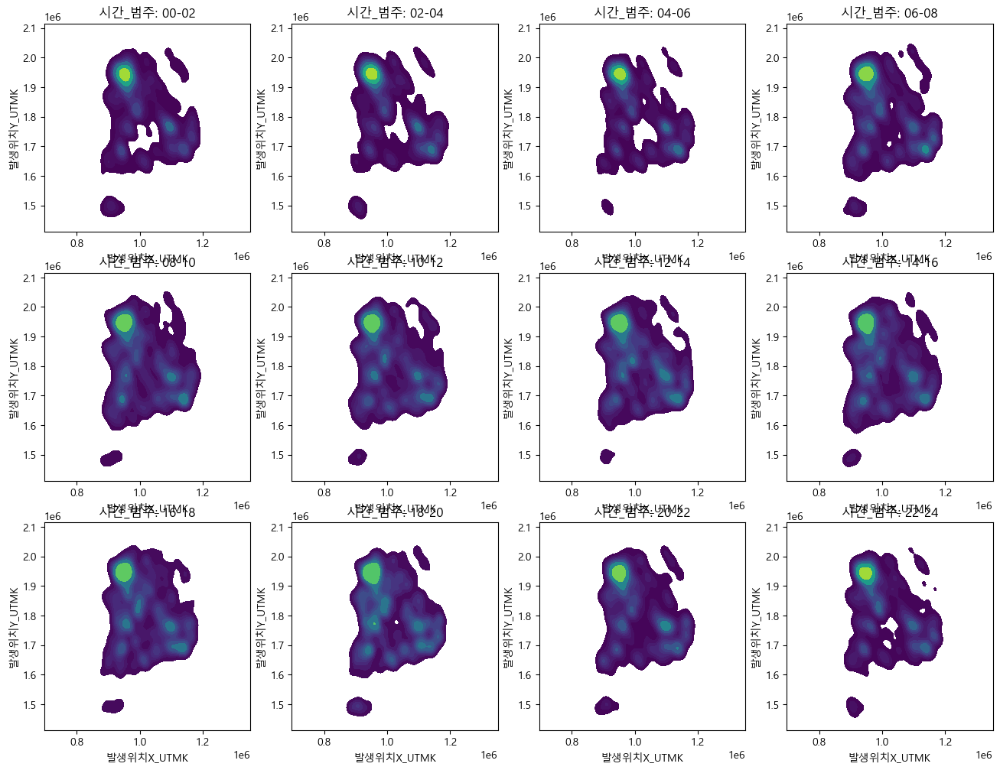

<Figure size 4000x4000 with 0 Axes>

In [162]:
import seaborn as sns
import matplotlib.pyplot as plt

def group_and_plot_kde(data, group_by, figsize=(16, 12)):
    # 기준에 따라 데이터 그룹화
    grouped_data = data.groupby(group_by)
    
    # subplot 설정
    num_plots = len(grouped_data)
    ncols = 4 if num_plots > 4 else num_plots
    nrows = (num_plots - 1) // ncols + 1
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axes = axes.flatten()

    # 전체 데이터에서 x, y의 최소 및 최대 값 추출
    x_min = data['발생위치X_UTMK'].min()
    x_max = data['발생위치X_UTMK'].max()
    y_min = data['발생위치Y_UTMK'].min()
    y_max = data['발생위치Y_UTMK'].max()

    # 비율 설정
    n = 1.2  # 원래 범위의 1.2배 크기로 확대

    # 새로운 x와 y의 범위 설정
    x_range = (x_max - x_min) * n
    y_range = (y_max - y_min) * n
    x_center = (x_max + x_min) / 2
    y_center = (y_max + y_min) / 2
    
    # 그래프 크기와 해상도 설정
    plt.figure(figsize=(20, 20), dpi=200)
    
    # 각 그룹에 대해 KDE 플롯 그리기
    for i, (group_value, group) in enumerate(grouped_data):
        ax = axes[i]
        ax.set_title(f'{group_by}: {group_value}')
        sns.kdeplot(x=group['발생위치X_UTMK'], y=group['발생위치Y_UTMK'], cmap="viridis", shade=True, bw_adjust=0.5, ax=ax)
        ax.set_xlabel('발생위치X_UTMK')
        ax.set_ylabel('발생위치Y_UTMK')
        ax.set_xlim(x_center - x_range / 2, x_center + x_range / 2)  # x 범위 설정
        ax.set_ylim(y_center - y_range / 2, y_center + y_range / 2)  # y 범위 설정

    # 나머지 subplot 비우기
    for ax in axes[num_plots:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# 예시 데이터프레임과 함수 호출
group_and_plot_kde(anly, '월')
group_and_plot_kde(anly, '요일')
group_and_plot_kde(anly, '시간_범주')



지도에 사건이 발생한 밀도에 따른 정보를 표시하고 있다.

사건 발생 밀도가 높은 지역은 녹색이다.

서울권에 사건 발생 밀도가 높은 것을 확인할 수 있다.

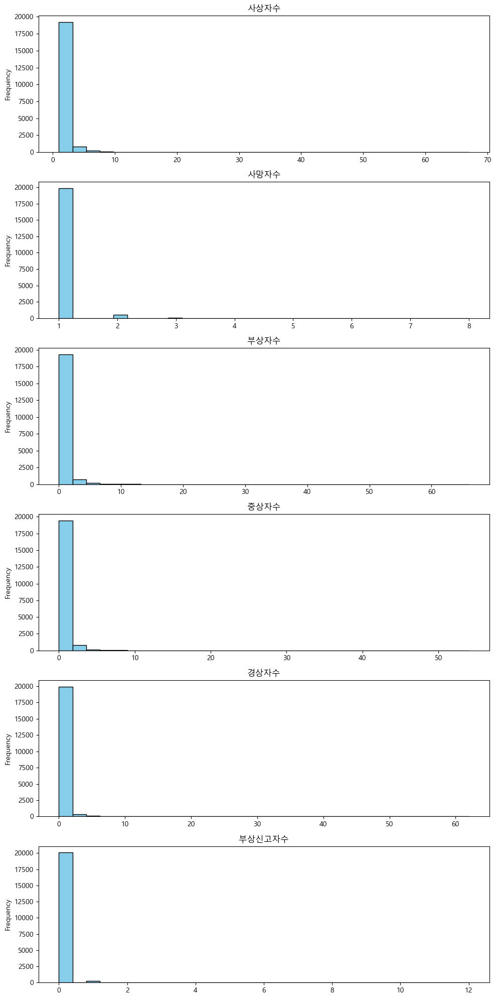

In [163]:
# 히스토그램을 그릴 열 선택
columns_to_plot = person_columns


# 각 열에 대한 히스토그램 그리기
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(10, 20))
for i, column in enumerate(columns_to_plot):
    axes[i].hist(df[column], bins=30, color='skyblue', edgecolor='black')
    axes[i].set_title(column)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

사망자/ 부상자 수와 관련된 데이터의 분포를 살펴 보았다.

데이터가 1에 치우져 있음을 알 수 있다.

최대 값은 60정도 이지만 그 수가 극히 적다.

# 정규화를 진행한다.

In [164]:
anly.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20450 entries, 1 to 2656
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   요일          20450 non-null  category
 1   월           20450 non-null  category
 2   시           20450 non-null  int32   
 3   시간_범주       20450 non-null  category
 4   사상자수_라벨     20450 non-null  category
 5   사상자수        20450 non-null  int64   
 6   사망자수        20450 non-null  int64   
 7   부상자수        20450 non-null  int64   
 8   중상자수        20450 non-null  int64   
 9   경상자수        20450 non-null  int64   
 10  부상신고자수      20450 non-null  int64   
 11  발생위치X_UTMK  20450 non-null  float64 
 12  발생위치Y_UTMK  20450 non-null  float64 
dtypes: category(4), float64(2), int32(1), int64(6)
memory usage: 1.6 MB


우선 변수의 scale을 변경해 준다. minmaxScaler를 사용하여 진행한다.

적용 대상 항목은 모든 숫자 컬럼이다.

In [165]:
from sklearn.preprocessing import StandardScaler,  MinMaxScaler
from sklearn.cluster import KMeans

def scale(data, log_opt=True, scaler_opt=True):
    data_scaled = data.copy()
    if log_opt == True:
        for col in person_columns:
            if col in numeric_columns:
                data_scaled[col] = np.log1p(data_scaled[col])

    if scaler_opt == True:
        scaler = MinMaxScaler()
    else:
        scaler = StandardScaler()

    data_scaled[numeric_columns] = scaler.fit_transform(data[numeric_columns])
    return data_scaled


anly_scaled = scale(anly)
# 이후 최적의 클러스터 수를 선택하고 해당 클러스터 수로 다시 K-means 클러스터링 수행

# 엘보우/WCSS

엘보우 기법을 사용한다. 여기서 찾은 적절한 K는 3 혹은 4이다. 앞으로 3를 이용하여 클러스터링을 진행한다.

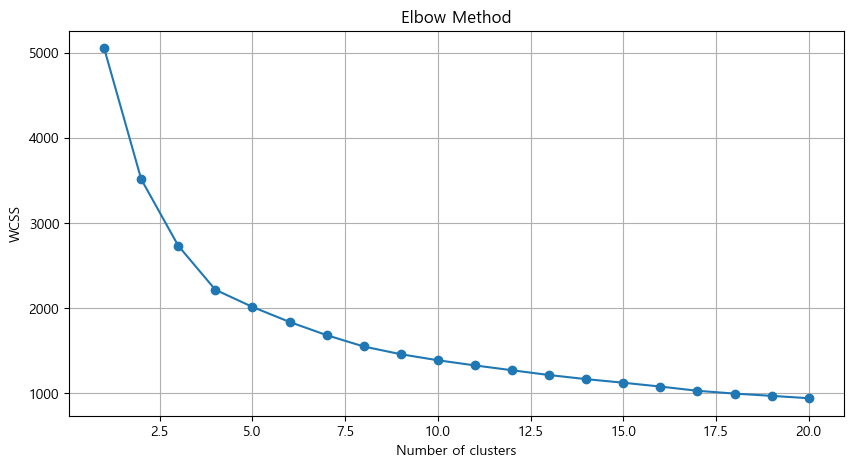

In [166]:
def paint_wcs(data):
    # 엘보우 방법을 사용해 최적의 클러스터 수 찾기
    wcss = []
    num = 21
    for i in range(1, num):
        kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # WCSS 그래프 그리기
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num), wcss, marker='o')
    plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.grid(True)
    plt.show()

paint_wcs(anly_scaled[numeric_columns])

이 그래프를 확인해 보면 적당한 K의 수가 3-4인 것을 알 수 있다.

# 클러스터링
본격적으로 클러스터링을 진행한다. 동시에 실루엣 점수도 구하였다.
분석에 사용한 K 수는 4이다.

In [167]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def clustering_data(data, n_clusters):
    """
    데이터를 클러스터링 하는 함수

    Parameters:
    - data: DataFrame, 원본 데이터.
    - group_by: str, subplot을 생성할 기준이 되는 열 이름 (예: '월', '시간대').
    - n_clusters: int, 클러스터의 개수.
    """
    # 원본 데이터의 사본을 만들어 작업
    anly_copy = data.copy()
    anly_copy2 = anly.copy()
    
    # MinMax 정규화를 적용
    scaler = MinMaxScaler()
    anly_copy[numeric_columns] = scaler.fit_transform(anly_copy[numeric_columns])
    
    # K-means 클러스터링 실행
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    anly_copy['Cluster'] = kmeans.fit_predict(anly_copy[numeric_columns])
    anly_copy2['Cluster'] = anly_copy['Cluster']

    # 실루엣 점수 계산
    silhouette_avg = silhouette_score(anly_copy[numeric_columns], anly_copy['Cluster'])

    return anly_copy2, silhouette_avg




clustring, score = clustering_data(data=anly_scaled, n_clusters=4)
print(f'실루엣 점수: {score}')


실루엣 점수: 0.2640553555252465


# 클러스터링 시각화

클러스터를 시각화 해준다.

월별/시간대별/요일별/을 기준으로 하여 subplot을 생성하였다.

모든 plot들은 x,y가 실제 지도에 나타나는 좌표를 의미한다.

3d plot인 경우 z값은 사상자수이다.


# 분석

전체적으로 특별한 의미를 가지도록 분산되어 있는 것으로 보이지 않는다. 중심점을 찾는것이 힘들다.

특이점으로 12-14시 사이에 집중되어 있는  진녹색 클러스터가 하나 존재하고 있다.

미묘하게 노란색 클러스터의 사상자수가 더 많은 편이다.





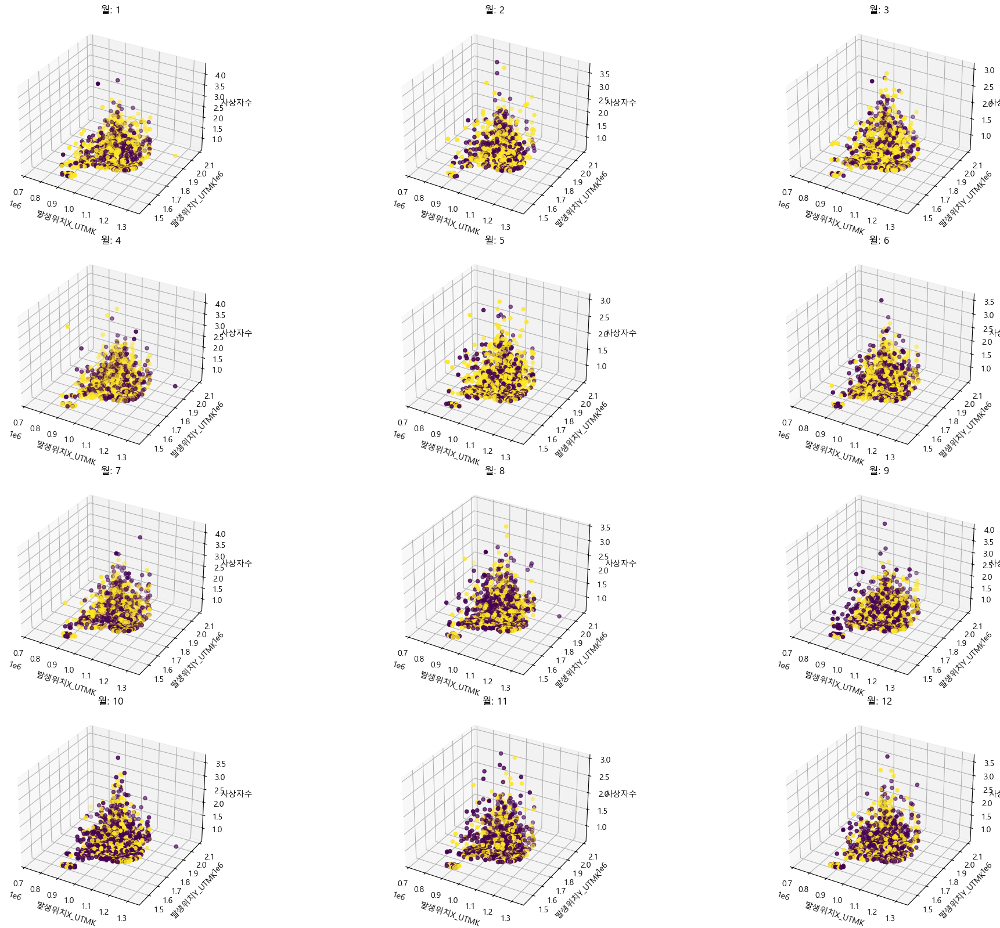

In [168]:
def plot_cluster(data, group_by, z_column, log_opt=True):
    # subplot 생성 기준에 따른 고유값
    unique_values = data[group_by].unique()
    
    # 로그 변환 선택적 적용
    if log_opt:
        # 데이터 사본 생성
        data_log = data.copy()
        for col in ['사상자수','사망자수', '부상자수', '중상자수', '경상자수', '부상신고자수']:
            data_log[col] = np.log1p(data_log[col])
        data = data_log  # 로그 변환된 사본을 사용

    # x, y 축 범위 동적 조정
    x_min, x_max = data['발생위치X_UTMK'].min(), data['발생위치X_UTMK'].max()
    y_min, y_max = data['발생위치Y_UTMK'].min(), data['발생위치Y_UTMK'].max()
    x_center, y_center = (x_max + x_min) / 2, (y_max + y_min) / 2
    x_range = (x_max - x_min) * 1.2
    y_range = (y_max - y_min) * 1.2

    # subplot 그리기
    fig = plt.figure(figsize=(20, 20))
    for i, value in enumerate(sorted(unique_values), start=1):
        ax = fig.add_subplot(len(unique_values) // 3 + 1, 3, i, projection='3d')
        subset = data[data[group_by] == value]
        
        ax.scatter(subset['발생위치X_UTMK'], subset['발생위치Y_UTMK'], subset[z_column],
                   c=subset['Cluster'], cmap='viridis', marker='o')
        ax.set_title(f'{group_by}: {value}')
        ax.set_xlim([x_center - x_range/2, x_center + x_range/2])
        ax.set_ylim([y_center - y_range/2, y_center + y_range/2])
        ax.set_xlabel('발생위치X_UTMK')
        ax.set_ylabel('발생위치Y_UTMK')
        ax.set_zlabel(z_column)

    plt.tight_layout()
    plt.show()


plot_cluster(clustring, group_by='월', z_column='사상자수')

월별로 사건의 발생 위치를 표시해 준다.

z값은 사상자 수이다.

클러스터 사이의 의미있는 경계를 발견할 수 없다.

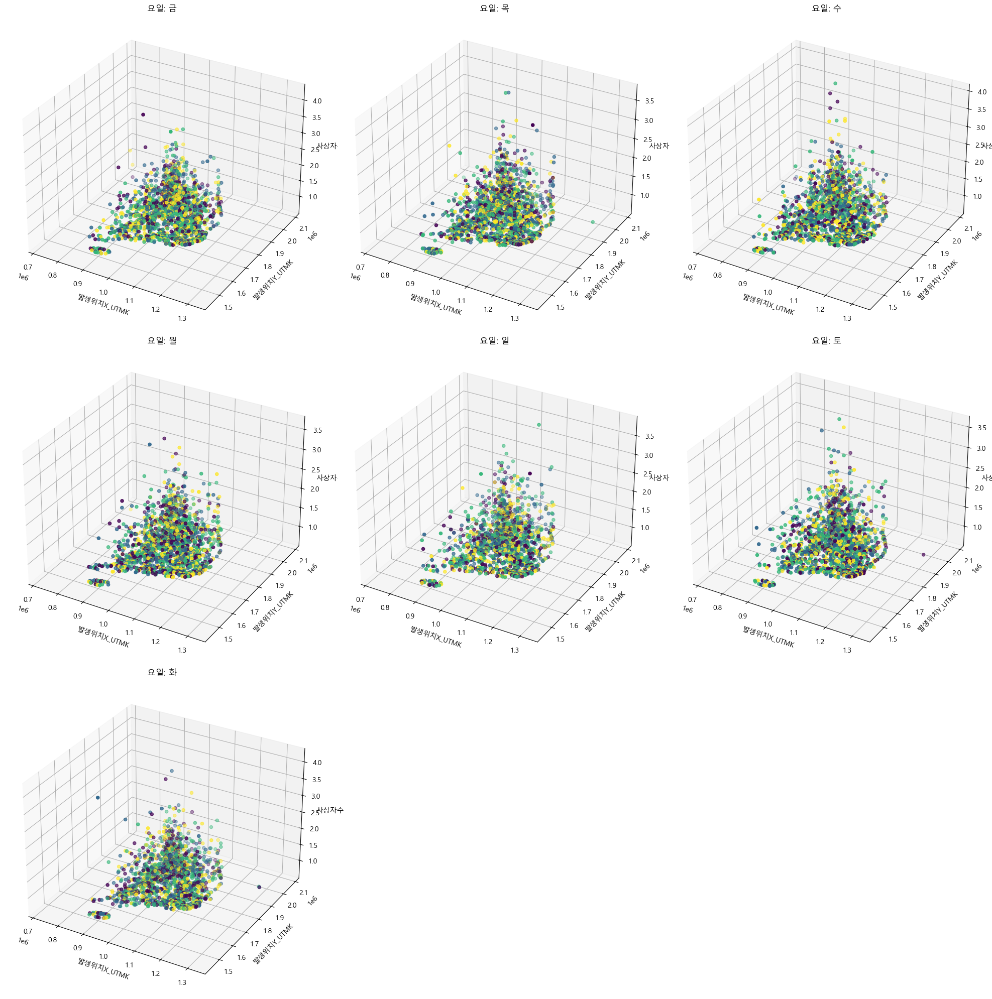

In [169]:
plot_cluster(clustring, group_by='요일', z_column='사상자수')

요일별로 사건의 발생 위치를 표시해 준다.

z값은 사상자 수이다.

클러스터 사이의 의미있는 경계를 발견할 수 없다.

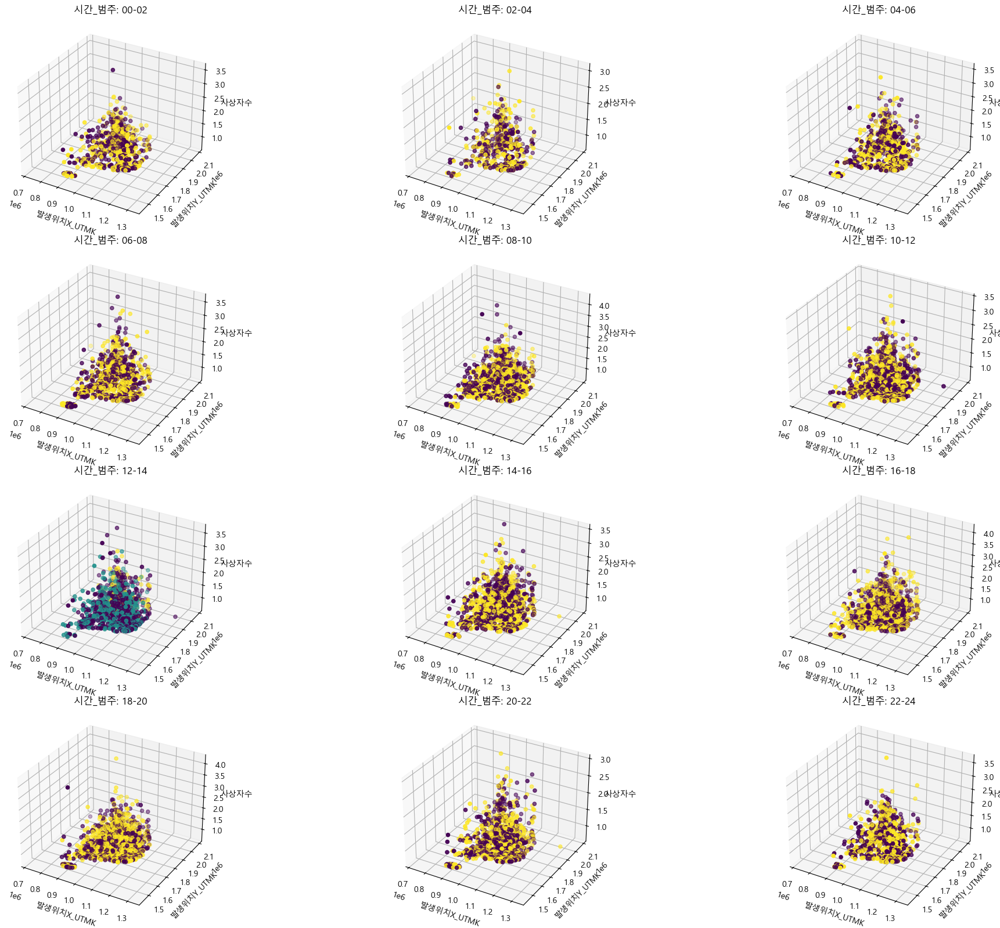

In [170]:
plot_cluster(clustring, group_by='시간_범주', z_column='사상자수')

시간대별로 사건의 발생 위치를 표시해 준다.

z값은 사상자 수이다.

12-14시 사이에만 나타나는 특이한 클러스터를 발견할 수 있다.

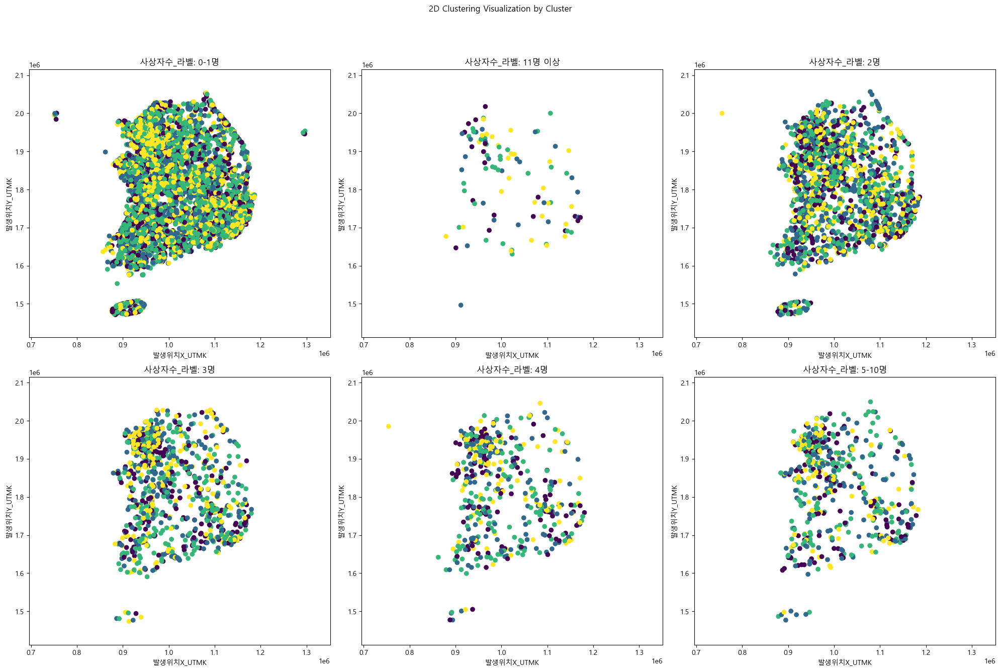

In [171]:
def plot_cluster_2d(data, group_by):
    """
    데이터를 클러스터별로 2차원 산점도를 그리고 각 클러스터를 subplot으로 시각화하는 함수.

    Parameters:
    - data: DataFrame, 원본 데이터.
    - group_by: str, 클러스터링 결과를 그룹화할 기준 열 이름 (예: 'Cluster').
    """
    
    # x, y 축 범위 동적 조정
    x_min, x_max = data['발생위치X_UTMK'].min(), data['발생위치X_UTMK'].max()
    y_min, y_max = data['발생위치Y_UTMK'].min(), data['발생위치Y_UTMK'].max()
    x_center, y_center = (x_max + x_min) / 2, (y_max + y_min) / 2
    x_range = (x_max - x_min) * 1.2
    y_range = (y_max - y_min) * 1.2


    unique_values = data[group_by].unique()
    # subplot 그리기
    fig = plt.figure(figsize=(20, 20))
    for i, value in enumerate(sorted(unique_values), start=1):
        ax = fig.add_subplot(len(unique_values) // 3 + 1, 3, i)
        subset = data[data[group_by] == value]
        
        ax.scatter(subset['발생위치X_UTMK'], subset['발생위치Y_UTMK'],
                   c=subset['Cluster'], cmap='viridis', marker='o')
        ax.set_title(f'{group_by}: {value}')
        ax.set_xlim([x_center - x_range/2, x_center + x_range/2])
        ax.set_ylim([y_center - y_range/2, y_center + y_range/2])
        ax.set_xlabel('발생위치X_UTMK')
        ax.set_ylabel('발생위치Y_UTMK')

    # 전체 그림의 제목 설정
    plt.suptitle('2D Clustering Visualization by Cluster')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # 전체 레이아웃 조정
    plt.show()

plot_cluster_2d(clustring, group_by='사상자수_라벨')

사상자 수의 범위에 따라 플롯을 나누어 보았다.

여기에서도 특별한 클러스터 간의 경계를 찾기 어렵다.

# 평가

실루엣 점수: 0.2640553555252465
으로 완전히 잘못 분리 되지는 않았지만, 특별한 구분이 존재하는 클러스터를 발견하기는 힘들다.

12-14시 사이에만 존재하는 특정 클러스터가 존재하여 완전 무의미한 클러스터링은 아니다.

하지만 이 클러스터가 무엇을 의미하는지 의미파악까지는 하기가 힘들다.

처음 예상했던 결과와 실제 결과에 차이가 심하다.